<h3>Connect Google Drive</h3>

In [6]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


<h3>Packages</h3>

In [2]:
import torch
import torchvision
from PIL import Image, ImageDraw
from torchvision import models
from torch.nn import functional as F
import torch.nn as nn
from torchvision import datasets
from torchvision import transforms
from torchvision import utils
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
import imagesize
from torch.utils import data
import torch.optim as optim
from tqdm.notebook import tqdm
from sklearn.metrics import classification_report,confusion_matrix
import seaborn as sns
import os
from pathlib import Path
import pandas as pd
from torch.utils.data import SubsetRandomSampler,DataLoader,Dataset
from google.colab.patches import cv2_imshow

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [7]:
dataset_folder = '/content/gdrive/MyDrive/Cancer3/200X'
img_path = '/content/gdrive/MyDrive/Cancer3/200X/test/Benign/SOB_B_A-14-22549G-200-017.png'
training_dataset_path = '/content/gdrive/MyDrive/Cancer3/200X/train'
testing_dataset_path = '/content/gdrive/MyDrive/Cancer3/200X/test'
classes = sorted(os.listdir(dataset_folder + '/train'))
print(classes)

['Benign', 'Malignant']


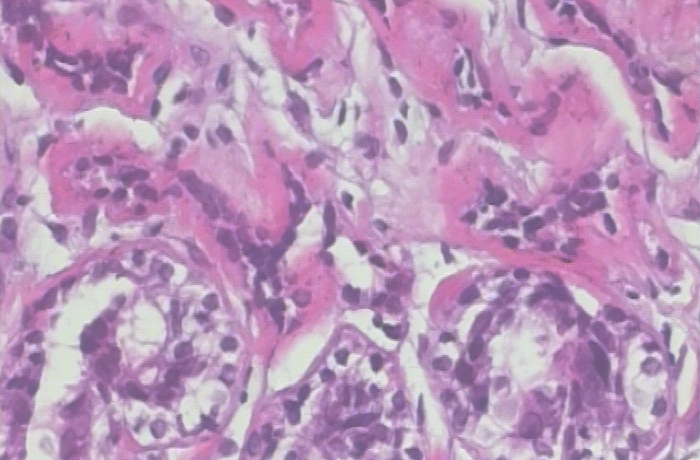

In [8]:
img = Image.open(img_path)
img

In [9]:
classes

['Benign', 'Malignant']

In [10]:
np.random.seed(0)
torch.manual_seed(0)

In [11]:
def image_transform():
  transform = transforms.Compose([
    transforms.Resize((512,512)),
    transforms.ToTensor(),
      transforms.Normalize(mean = [0.7920, 0.6120, 0.7663], std = [0.1043, 0.1375, 0.0836])
    ])
  return transform

In [12]:
transform = image_transform()

In [13]:
def load_dataset(path,transform_img):
  data = torchvision.datasets.ImageFolder(root=path, transform=transform)
  return data

In [14]:
training_dataset = load_dataset(training_dataset_path,transform)
training_dataset

Dataset ImageFolder
    Number of datapoints: 1269
    Root location: /content/gdrive/MyDrive/Cancer3/200X/train
    StandardTransform
Transform: Compose(
               Resize(size=(512, 512), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.792, 0.612, 0.7663], std=[0.1043, 0.1375, 0.0836])
           )

In [15]:
testing_dataset = load_dataset(testing_dataset_path,transform)
testing_dataset

Dataset ImageFolder
    Number of datapoints: 744
    Root location: /content/gdrive/MyDrive/Cancer3/200X/test
    StandardTransform
Transform: Compose(
               Resize(size=(512, 512), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.792, 0.612, 0.7663], std=[0.1043, 0.1375, 0.0836])
           )

In [16]:
train_loader = torch.utils.data.DataLoader(dataset = training_dataset, batch_size = 16,shuffle=True)

In [17]:
#Splitting Training Data into Training and Validation

dataset_size = len(testing_dataset)
dataset_indices = list(range(dataset_size))
np.random.shuffle(dataset_indices)
val_split_index = int(np.floor(0.3 * dataset_size)) #0.2 - 30:70 Ratio
train_idx, val_idx = dataset_indices[val_split_index:], dataset_indices[:val_split_index]
test_sampler = SubsetRandomSampler(train_idx)
val_sampler = SubsetRandomSampler(val_idx)
test_loader = torch.utils.data.DataLoader(dataset = testing_dataset,batch_size = 16,sampler=test_sampler,shuffle=False)
val_loader = DataLoader(dataset= testing_dataset, shuffle=False, batch_size=16, sampler=val_sampler)

<h3>Training Model</h3>

In [38]:
model = models.efficientnet_b0(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [39]:
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [40]:
model = model.to(device)

In [41]:
#Output Layer Modification
num_ftrs = model.classifier[1].in_features
num_classes = 2
model.classifier[1] = nn.Linear(num_ftrs, num_classes)

In [42]:
criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9,weight_decay = 0.03)

In [43]:
X = transform(img).unsqueeze_(0)

In [46]:
X = X.to(device)

In [54]:
outputs = model(X).data
outputs

tensor([[0.0128, 0.0297]], device='cuda:0')

In [50]:
def set_device():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    return device

In [61]:
import time
def train_nn(model, train_loader, test_loader,criterion,optimizer,n_epochs):
  device = set_device()
  best_acc = 0
  train_losses = []
  train_acc = []
  val_acc = []
  val_losses = []
  model = model.to(device)
  max_epoch_time = 0.0
  for epoch in range(n_epochs):
    start_time = time.time()
    print("Epoch number: %d"%(epoch+1))
    model.train()
    running_loss = 0.0
    running_correct = 0.0
    total = 0

    for data in train_loader:
      images,labels = data
      images = images.to(device) #for faster processing
      labels = labels.to(device)
      total += labels.size(0)
      optimizer.zero_grad() #Set grad = 0 before back prop
      outputs = model(images)

      _,predicted = torch.max(outputs.data,1)

      loss = criterion(outputs,labels)
      loss.backward() #Calculate Weight gradients
      optimizer.step() #update weights
      running_loss += loss.item()
      running_correct += predicted.eq(labels).sum().item()

    epoch_loss = running_loss/len(train_loader)
    epoch_acc = 100.0*running_correct/total
    train_losses.append(epoch_loss)
    train_acc.append(epoch_acc)
    print("  -Training Dataset, Got %d out of %d images correctly (%0.3f%%). Epoch Loss: %0.3f"%(running_correct, total, epoch_acc,epoch_loss))
    test_dataset_acc, test_dataset_loss = evaluate_model(model,test_loader,criterion)
    val_acc.append(test_dataset_acc)
    val_losses.append(test_dataset_loss)

    end_time = time.time()
    epoch_time = end_time - start_time
    max_epoch_time = max(max_epoch_time, epoch_time)

    if (test_dataset_acc>best_acc):
        best_acc = test_dataset_acc
        save_checkpoint(model, epoch, optimizer, best_acc, train_losses, train_acc, val_losses, val_acc,max_epoch_time)

  print('Finished Training')
  return model,train_losses,train_acc,val_acc,val_losses,max_epoch_time

In [65]:
import time
def train_nn(model, train_loader, test_loader,criterion,optimizer,n_epochs):
  device = set_device()
  best_acc = 0
  train_losses = []
  train_acc = []
  val_acc = []
  val_losses = []
  model = model.to(device)
  max_epoch_time = 0.0
  for epoch in range(n_epochs):
    start_time = time.time()
    print("Epoch number: %d"%(epoch+1))
    model.train()
    running_loss = 0.0
    running_correct = 0.0
    total = 0

    for data in train_loader:
      images,labels = data
      images = images.to(device) #for faster processing
      labels = labels.to(device)
      total += labels.size(0)
      optimizer.zero_grad() #Set grad = 0 before back prop
      outputs = model(images)

      _,predicted = torch.max(outputs.data,1)

      loss = criterion(outputs,labels)
      loss.backward() #Calculate Weight gradients
      optimizer.step() #update weights
      running_loss += loss.item()
      running_correct += predicted.eq(labels).sum().item()

    epoch_loss = running_loss/len(train_loader)
    epoch_acc = 100.0*running_correct/total
    train_losses.append(epoch_loss)
    train_acc.append(epoch_acc)
    print("  -Training Dataset, Got %d out of %d images correctly (%0.3f%%). Epoch Loss: %0.3f"%(running_correct, total, epoch_acc,epoch_loss))
    test_dataset_acc, test_dataset_loss = evaluate_model(model,test_loader,criterion)
    val_acc.append(test_dataset_acc)
    val_losses.append(test_dataset_loss)

    end_time = time.time()
    epoch_time = end_time - start_time
    max_epoch_time = max(max_epoch_time, epoch_time)

    if (test_dataset_acc>best_acc):
        best_acc = test_dataset_acc
        save_checkpoint(model, epoch, optimizer, best_acc, train_losses, train_acc, val_losses, val_acc,max_epoch_time)

  print('Finished Training')
  return model,train_losses,train_acc,val_acc,val_losses,max_epoch_time


def save_checkpoint(model, epoch, optimizer, best_acc, train_losses, train_acc, val_losses, val_acc, max_epoch_time):
    state = {
        'epoch': epoch + 1,
        'model': model.state_dict(),
        'best accuracy': best_acc,
        'optimizer': optimizer.state_dict(),
        'train_losses': train_losses,
        'train_acc': train_acc,
        'val_losses': val_losses,
        'val_acc': val_acc,
        'epoch_time': max_epoch_time
    }
    torch.save(state, '/content/gdrive/MyDrive/Models/200X_efficientnet0_model.pth')
def evaluate_model(model,test_loader,criterion):
    model.eval()
    predicted_correctly = 0
    total = 0
    device = set_device()
    running_loss = 0.0

    with torch.no_grad(): #Used for not backpropogating which improves computation speed
          for data in test_loader:
            images,labels = data
            images = images.to(device)
            labels = labels.to(device)
            total += labels.size(0) #total amount of images

            outputs = model(images)

            _,predicted = torch.max(outputs.data,1)
            loss = criterion(outputs,labels)
            running_loss+=loss.item()

            predicted_correctly+=predicted.eq(labels).sum().item()
    epoch_acc = 100.0*predicted_correctly/total
    epoch_loss = running_loss/len(test_loader)
    print('-  Testing dataset. Got %d out of %d images correctly (%0.3f%%). Loss: %0.3f' % (predicted_correctly, total, epoch_acc,epoch_loss))

    return epoch_acc,epoch_loss

#Train the model
#history, train_losses, train_acc, val_acc, val_losses = train_nn(model, train_loader,val_loader, criterion, optimizer_ft ,100)

Epoch number: 1
  -Training Dataset, Got 1092 out of 1269 images correctly (86.052%). Epoch Loss: 0.341
-  Testing dataset. Got 187 out of 223 images correctly (83.857%). Loss: 0.375
Epoch number: 2
  -Training Dataset, Got 1146 out of 1269 images correctly (90.307%). Epoch Loss: 0.245
-  Testing dataset. Got 193 out of 223 images correctly (86.547%). Loss: 0.330
Epoch number: 3
  -Training Dataset, Got 1186 out of 1269 images correctly (93.459%). Epoch Loss: 0.193
-  Testing dataset. Got 199 out of 223 images correctly (89.238%). Loss: 0.302
Epoch number: 4
  -Training Dataset, Got 1211 out of 1269 images correctly (95.429%). Epoch Loss: 0.143
-  Testing dataset. Got 198 out of 223 images correctly (88.789%). Loss: 0.281
Epoch number: 5
  -Training Dataset, Got 1228 out of 1269 images correctly (96.769%). Epoch Loss: 0.109
-  Testing dataset. Got 200 out of 223 images correctly (89.686%). Loss: 0.260
Epoch number: 6
  -Training Dataset, Got 1234 out of 1269 images correctly (97.242%).

ValueError: too many values to unpack (expected 5)

Load the Model

In [66]:
model_path = '/content/gdrive/MyDrive/Models/200X_efficientnet0_model.pth'
check = torch.load(model_path,map_location=torch.device(device)) #model in dictionary

<ipython-input-66-a9b81ec467b8>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  check = torch.load(model_path,map_location=torch.device(device)) #model in dictionary


In [67]:
check['best accuracy'] #Print best model accuracy during training

91.03139013452915

In [68]:
#Extract model from dictionary and save it in a dir
model.load_state_dict(check['model'])
#torch.save(model,'/content/gdrive/MyDrive/Cancer/model/mobilenet_v2_cancerend_nil.pth')

<All keys matched successfully>

In [69]:
def set_model(model,device):
  model = model.to(device)
  model.eval()
  return model

In [73]:
model = set_model(model,device)

In [76]:
def evaluate_model(model,test_loader,criterion):
    model.eval()
    predicted_correctly = 0
    total = 0
    device = set_device()
    running_loss = 0.0
    with torch.no_grad(): #Used for not backpropogating which improves computation speed
          for data in test_loader:
            images,labels = data
            images = images.to(device)
            labels = labels.to(device)
            total += labels.size(0) #total amount of images

            outputs = model(images)

            _,predicted = torch.max(outputs.data,1)
            loss = criterion(outputs,labels)
            running_loss+=loss.item()

            predicted_correctly+=(predicted==labels).sum().item()
    epoch_acc = 100.0*predicted_correctly/total
    epoch_loss = running_loss/len(test_loader)
    print('-  Testing dataset. Got %d out of %d images correctly (%0.3f%%). Loss: %0.3f' % (predicted_correctly, total, epoch_acc,epoch_loss))
    return epoch_acc,epoch_loss
evaluate_model(model,test_loader,criterion)

-  Testing dataset. Got 479 out of 521 images correctly (91.939%). Loss: 0.220


(91.93857965451056, 0.220040480860255)

<h3>Test Model</h3>

In [80]:
img_path = '/content/gdrive/MyDrive/Cancer3/200X/test/Malignant/SOB_M_DC-14-11520-200-005.png'

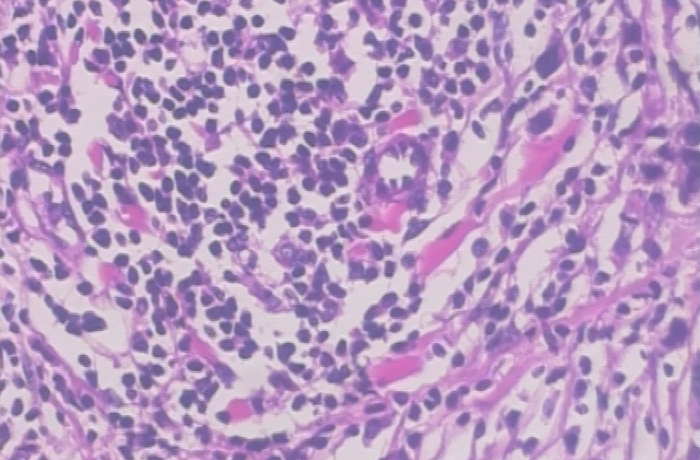

In [81]:
img = Image.open(img_path)
img

In [82]:
def classify(model,image_transforms,image_path, classes,device):
  model = set_model(model,device)
  image = Image.open(image_path)
  image = image_transforms(image).to(device)
  image = image.unsqueeze(0)
  output = model(image)
  _,predicted = torch.max(output,1)
  print(classes[predicted.item()])

In [83]:
classify(model, transform, img_path,classes,device)

Malignant


In [84]:
#Original Architecture
#mobilenet_model

In [87]:
class EfficientNetB_0(nn.Module):
    def __init__(self, model,num_classes=2):
        super(EfficientNetB_0, self).__init__()

        self.features = nn.Sequential(*list(model.features.children())[:-1])
        self.conv18 = nn.Sequential(
            nn.Conv2d(320, 1280, kernel_size=1, stride=1, bias=False),
            nn.BatchNorm2d(1280,eps=1e-05,momentum=0.1, affine=True, track_running_stats=True),
            nn.SiLU(inplace=True)
        )
        self.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        self.classifier = nn.Sequential(
            nn.Dropout(p=0.2, inplace=False),
            nn.Linear(1280, num_classes,bias=True)
        )
        self.gradients = None

    def activations_hook(self, grad):
        self.gradients = grad

    def forward(self, x):
        x = self.features(x)
        x = self.conv18(x)
        h = x.register_hook(self.activations_hook)
        x = x.mean([2, 3])
        x = self.classifier(x)
        return x

    def get_gradients(self):
        return self.gradients

    def get_featuremaps(self, x):
        return self.conv18(self.features(x))

In [88]:
model_instance = EfficientNetB_0(model, num_classes = 2)

In [90]:
eff0model = set_model(model_instance,device)

In [ ]:
#mobilenet #Architecture afterwards

In [91]:
dim = transform(img).shape #Dimensions of Transformed Image

In [92]:
dim

torch.Size([3, 512, 512])

In [103]:
logits = model(X)
_,index = torch.max(logits,dim=1)
logits[:,index.item()]

tensor([0.9965], device='cuda:0', grad_fn=<SelectBackward0>)

In [93]:
def GradCAM(model,img,transform):
  X = transform(img)
  X.unsqueeze_(0)
  X = X.to(device)
  logits = model(X)

  _,index = torch.max(logits,dim=1)
  per = torch.nn.functional.softmax(logits,dim=1)[0]*100
  logits[:,index.item()].backward()
  print(f"Predicted Class: {classes[index[0]]}")
  print(f"Probability Percentage: {per[index[0]].item():0.2f}%")

  gradients = model.get_gradients()
  pooled_gradients  = torch.mean(gradients, dim=[0,2,3])
  feature_maps = model.get_featuremaps(X).detach()

  for i in range(1280):
    feature_maps[:,i,:,:] *= pooled_gradients[i]

  avg_feats = torch.mean(feature_maps, dim=1).squeeze()

  return avg_feats

In [94]:
heatmap = GradCAM(eff0model,img,transform)

Predicted Class: Malignant
Probability Percentage: 60.74%


In [95]:
def visualize_heatmap(map):
  map = map.to('cpu')
  map = np.maximum(map, 0)
  map /= torch.max(map)
  return map

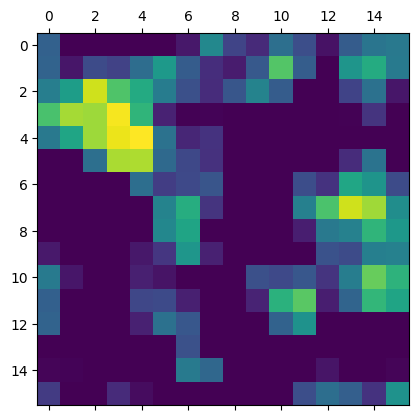

In [96]:
gradcam_heatmap = visualize_heatmap(heatmap)
plt.matshow(gradcam_heatmap)

In [97]:
def visualize_activation_map(heatmap,dim):
  if isinstance(heatmap, torch.Tensor):
    heatmap = heatmap.cpu().numpy()
  heatmap = cv.resize(heatmap, (dim[1],dim[2]))
  heatmap = np.uint8(255 * heatmap)
  heatmap = cv.applyColorMap(heatmap,cv.COLORMAP_JET)
  return heatmap

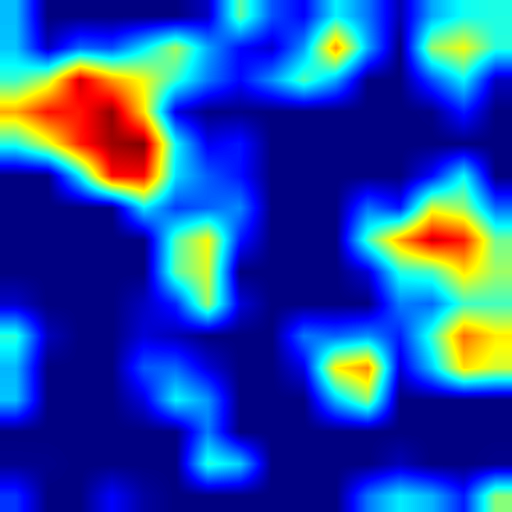

In [98]:
gradcam_activation_map = visualize_activation_map(gradcam_heatmap,dim)
cv2_imshow(gradcam_activation_map)

In [99]:
def visualize_superimposed(activation_map,img_path,dim):
  img = cv.imread(img_path)
  img = cv.resize(img,(dim[1],dim[2]))
  superimposed_img = activation_map*0.3 + img*0.7
  return superimposed_img

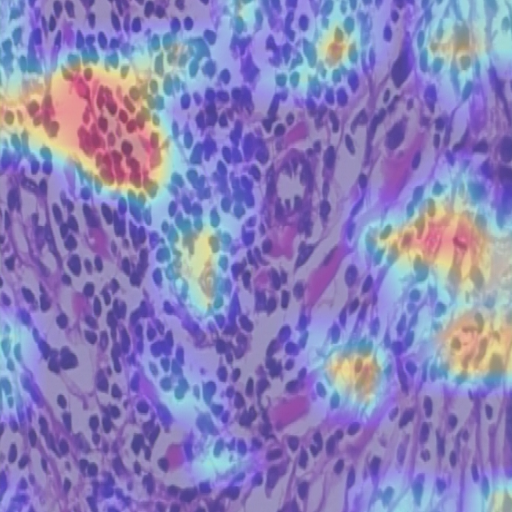

In [100]:
gradcam_superimposed = visualize_superimposed(gradcam_activation_map,img_path,dim)
cv2_imshow(gradcam_superimposed)

<h3>Guided Backpropagation</h3>

In [104]:
!pip install git+https://github.com/jacobgil/pytorch-grad-cam.git

  Cloning https://github.com/jacobgil/pytorch-grad-cam.git to /tmp/pip-req-build-t82l1b1z
  Running command git clone --filter=blob:none --quiet https://github.com/jacobgil/pytorch-grad-cam.git /tmp/pip-req-build-t82l1b1z
  Resolved https://github.com/jacobgil/pytorch-grad-cam.git to commit a2a23f83916d1caa428c447890d7ed5870818341
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39092 sha256=96365639b4babc320c5b3e657be8bfeaf3bcb4d5aff5a0fc621d7769b9d22704
  Stored in directory: /tmp/pip-ephem-wheel-cache-ytgg0v_w/wheels/23/11/66/71a38b0c29ba4ec5f62105a2145278613855bc9c94eecf630d
Successfully built grad-cam


In [105]:
from pytorch_grad_cam.utils.find_layers import replace_all_layer_type_recursive
from torch.autograd import Function

In [106]:
img = Image.open(img_path)

In [107]:
class GuidedBackpropReLU(Function):
  @staticmethod
  def forward(self,input_img):
    positive_mask = (input_img>0).type_as(input_img)
    output = torch.addcmul(
        torch.zeros(input_img.size()).type_as(input_img),input_img,positive_mask)
    self.save_for_backward(input_img,output)
    return output

  @staticmethod
  def backward(self,grad_output):
    input_img,output = self.saved_tensors
    grad_input = None
    positive_mask1 = (input_img>0).type_as(grad_output)
    positive_mask2 = (grad_output>0).type_as(grad_output)
    grad_input = torch.addcmul(
        torch.zeros(input_img.size()).type_as(input_img),torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),grad_output,positive_mask1),positive_mask2)
    return grad_input

In [108]:
class GuidedBackpropReLUasModule(torch.nn.Module):
    def __init__(self):
        super(GuidedBackpropReLUasModule, self).__init__()

    def forward(self, input_img):
        return GuidedBackpropReLU.apply(input_img)

In [109]:
class GuidedBackpropReLUModel:
  def __init__(self, model, use_cuda):
        self.model = model
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = self.model.cuda()

  def forward(self,input_img):
    return self.model(input_img)

  def recursive_replace_relu_with_guidedrelu(self, module_top):
         for idx, module in module_top._modules.items():
             self.recursive_replace_relu_with_guidedrelu(module)
             if module.__class__.__name__ == 'ReLU':
                 module_top._modules[idx] = GuidedBackpropReLU.apply
         print("b")

  def recursive_replace_guidedrelu_with_relu(self, module_top):
        try:
            for idx, module in module_top._modules.items():
                self.recursive_replace_guidedrelu_with_relu(module)
                if module == GuidedBackpropReLU.apply:
                    module_top._modules[idx] = torch.nn.ReLU()
        except BaseException:
            pass

  def __call__(self, input_img, target_category=None):
        replace_all_layer_type_recursive(self.model,
                                         torch.nn.ReLU,
                                         GuidedBackpropReLUasModule())

        if self.cuda:
            input_img = input_img.cuda()

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        if target_category is None:
            target_category = np.argmax(output.cpu().data.numpy())

        loss = output[0, target_category]
        loss.backward(retain_graph=True)

        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]
        output = output.transpose((1, 2, 0))

        replace_all_layer_type_recursive(self.model,
                                         GuidedBackpropReLUasModule,
                                         torch.nn.ReLU())

        return output

In [110]:
guided_backprop_model = GuidedBackpropReLUModel(model=eff0model,use_cuda=False)

In [111]:
def guided_backprop_output(model,img):
  X = transform(img)
  X.unsqueeze_(0)
  X = X.to(device)
  preds = model.forward(X)
  _, predicted_class = preds.max(1)
  print("Predicted Class:", classes[predicted_class.item()])
  guided_backprop_output = guided_backprop_model(X, target_category=predicted_class.item())

  return guided_backprop_output

In [112]:
guided_backprop_output = guided_backprop_output(guided_backprop_model,img)

Predicted Class: Malignant


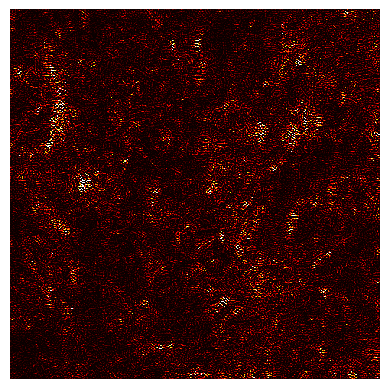

In [113]:
guided_backprop_activation_map = np.mean(guided_backprop_output, axis=-1)
plt.imshow(guided_backprop_activation_map, cmap='hot', vmin=0, vmax=np.percentile(guided_backprop_activation_map, 99))
plt.axis('off')
plt.show()

In [114]:
def visualize_activation_map_ggbp(heatmap,dim,img_path):
  if isinstance(heatmap, torch.Tensor):
    heatmap = heatmap.cpu().numpy()
  heatmap = cv.resize(heatmap, (dim[1],dim[2]))
  heatmap = np.uint8(255 * heatmap)
  heatmap = cv.applyColorMap(heatmap,cv.COLORMAP_PLASMA) #Changed from JET to PLASMA
  img = cv.imread(img_path)
  img = cv.resize(img,(dim[1],dim[2]))
  superimposed_img = heatmap*0.6 + img*0.5
  return superimposed_img,heatmap

In [115]:
guided_backprop_superimposed, guided_backprop_am = visualize_activation_map_ggbp(guided_backprop_activation_map,dim,img_path)

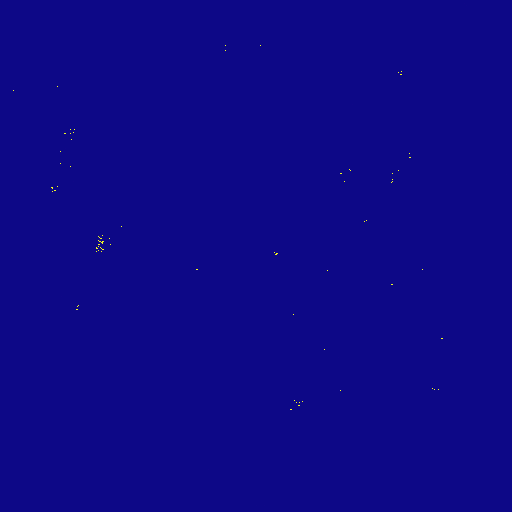

In [116]:
cv2_imshow(guided_backprop_am)

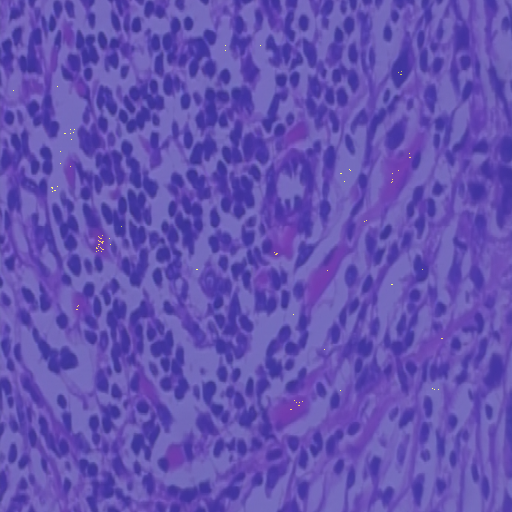

In [117]:
cv2_imshow(guided_backprop_superimposed)

<h3> Guided GradCAM </h3>

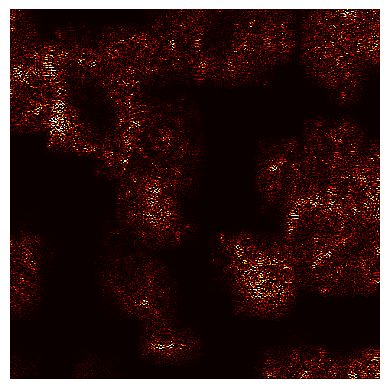

In [118]:
gradcam_sum = np.sum(gradcam_activation_map, axis=-1) #Convert heatmap to grayscale
normalized_gradcam_sum = (gradcam_sum - gradcam_sum.min()) / (gradcam_sum.max() - gradcam_sum.min() + 1e-8)
guided_gradcam_activation_map = normalized_gradcam_sum * guided_backprop_activation_map
plt.imshow(guided_gradcam_activation_map, cmap='hot', vmin=0, vmax=np.percentile(guided_gradcam_activation_map, 99))
plt.axis('off')
plt.show()

In [119]:
guided_gradcam_superimposed, guided_gradcam_am = visualize_activation_map_ggbp(guided_gradcam_activation_map,dim,img_path)

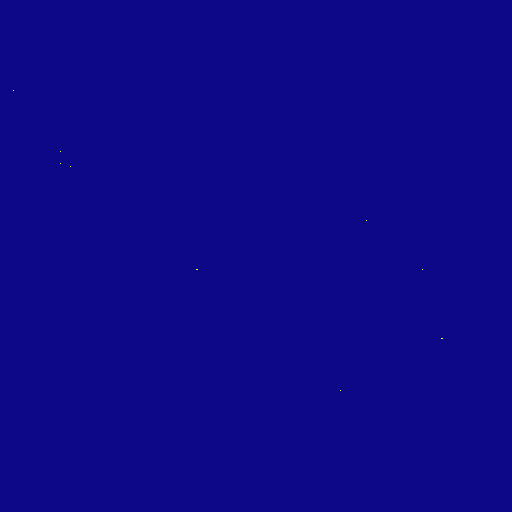

In [120]:
cv2_imshow(guided_gradcam_am)

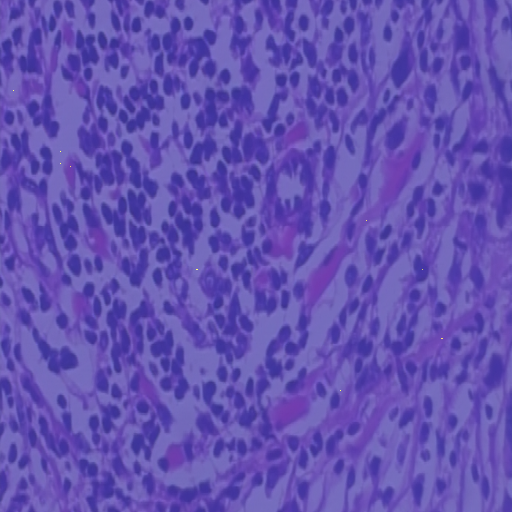

In [121]:
cv2_imshow(guided_gradcam_superimposed)

<h3> Saliency Maps </h3>

In [122]:
img = Image.open(img_path)

In [123]:
def saliency_maps_generate(img,model):
  model.eval()

  X = transform(img)
  X.unsqueeze_(0)
  X = X.to(device)
  X.requires_grad_()

  logits = model(X)
  scores_max_index = logits.argmax()
  print("Predicted Class: ", classes[scores_max_index.item()])

  score_max = logits[:, scores_max_index.item()]
  score_max.backward()

  saliency, _ = torch.max(X.grad.data.abs(), dim=1)
  saliency.squeeze_(0)

  return saliency

In [132]:
saliency_activation_map = saliency_maps_generate(img,model)

Predicted Class:  Malignant


In [133]:
saliency_activation_map = saliency_activation_map.to('cpu')

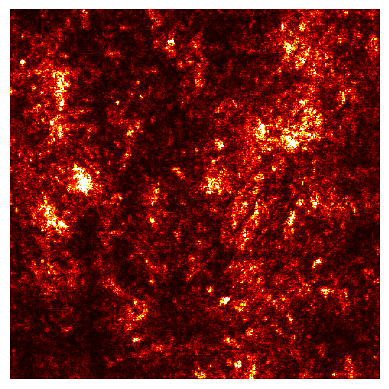

In [134]:
plt.imshow(saliency_activation_map, cmap='hot', vmin=0, vmax=np.percentile(saliency_activation_map, 99))
plt.axis('off') #sets min value of color scale to 0 and maximum value to 99th percentile of the heatmap
plt.show()

In [135]:
def visualize_activation_map_ggbp(heatmap,dim,img_path):
  if isinstance(heatmap, torch.Tensor):
    heatmap = heatmap.cpu().numpy()
  heatmap = cv.resize(heatmap, (dim[1],dim[2]))
  heatmap = np.uint8(255 * heatmap)
  heatmap = cv.applyColorMap(heatmap,cv.COLORMAP_JET)
  img = cv.imread(img_path)
  img = cv.resize(img,(dim[1],dim[2]))

  superimposed_img = heatmap*0.6 + img*0.5
  return superimposed_img,heatmap
saliency_superimposed, saliency_am = visualize_activation_map_ggbp(saliency_activation_map,dim,img_path)

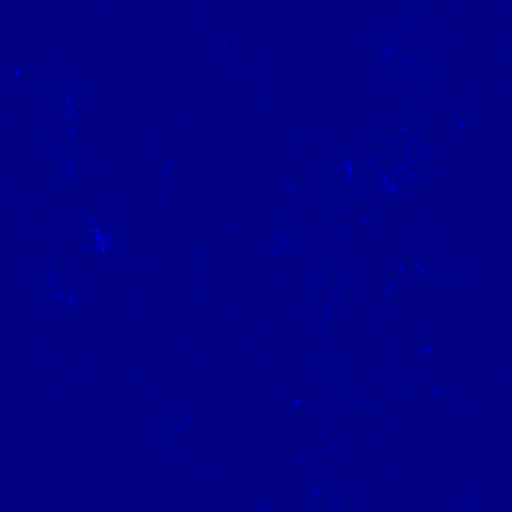

In [136]:
cv2_imshow(saliency_am)

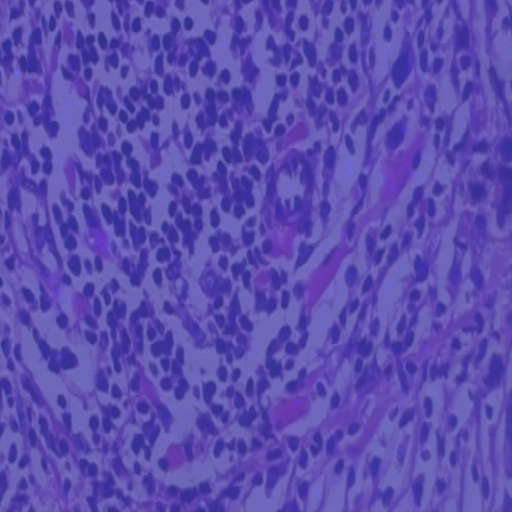

In [137]:
cv2_imshow(saliency_superimposed)

<h2>GradCAM Plus Plus</h2>

In [138]:
img_path

'/content/gdrive/MyDrive/Cancer3/200X/test/Malignant/SOB_M_DC-14-11520-200-005.png'

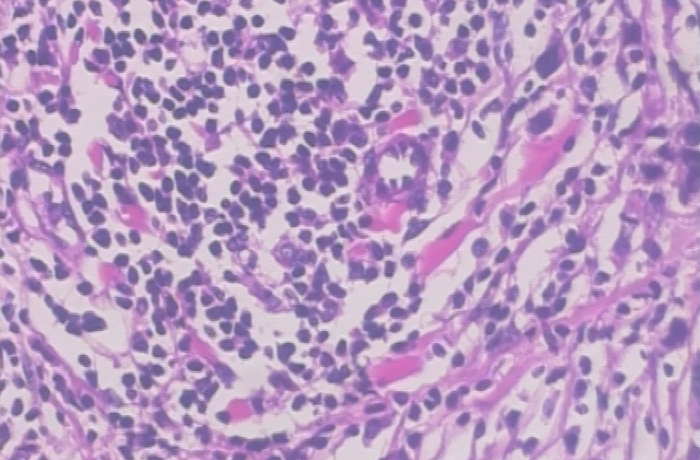

In [139]:
img = Image.open(img_path)
img

In [140]:
def GradCAMPP(img,transform,model):
  X = transform(img)
  X.unsqueeze_(0)
  X = X.to(device)

  b, c, h, w = X.size()
  logits = model(X)
  _,index = torch.max(logits,dim=1)
  print("Predicted Label:", classes[index[0]])
  score = logits[:,index[0].item()]
  score.backward()
  gradients = model.get_gradients()
  activations = model.get_featuremaps(X).detach()
  b, k, u, v = gradients.size()

  alpha_num = gradients.pow(2)
  alpha_denom = gradients.pow(2).mul(2) + activations.mul(gradients.pow(3)).view(b, k, u*v).sum(-1, keepdim=True).view(b, k, 1, 1)
  alpha_denom = torch.where(alpha_denom != 0.0, alpha_denom, torch.ones_like(alpha_denom))

  alpha = alpha_num.div(alpha_denom+1e-7)
  positive_gradients = F.relu(score.exp()*gradients) # ReLU(dY/dA) == ReLU(exp(S)*dS/dA))
  weights = (alpha*positive_gradients).view(b, k, u*v).sum(-1).view(b, k, 1, 1)

  saliency_map = (weights*activations).sum(1, keepdim=True)
  saliency_map = F.relu(saliency_map)
  saliency_map_min, saliency_map_max = saliency_map.min(), saliency_map.max()
  saliency_map = (saliency_map-saliency_map_min).div(saliency_map_max-saliency_map_min).data

  saliency_map = torch.mean(saliency_map, dim=1).squeeze()

  return saliency_map

In [141]:
heatmap_gradcampp = GradCAMPP(img,transform, eff0model)

Predicted Label: Malignant


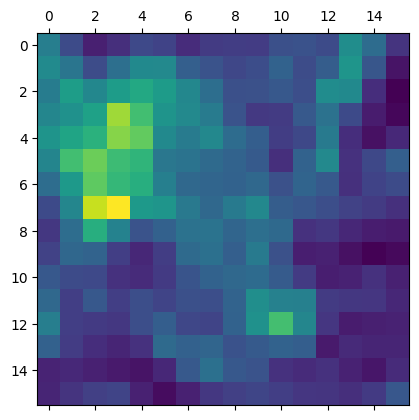

In [142]:
heatmap_gradcampp = heatmap_gradcampp.cpu()
plt.matshow(heatmap_gradcampp)

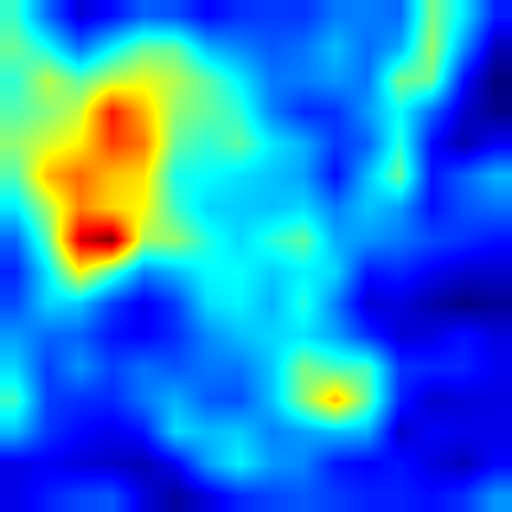

In [144]:
gradcampp_activation_map = visualize_activation_map(heatmap_gradcampp,dim)
cv2_imshow(gradcampp_activation_map)

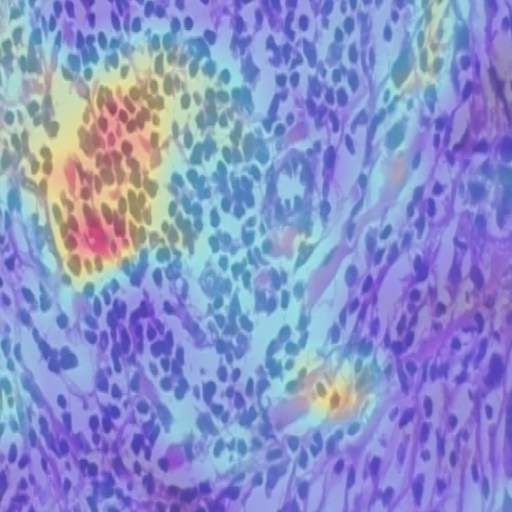

In [145]:
gradcampp_superimposed = visualize_superimposed(gradcampp_activation_map,img_path,dim)
cv2_imshow(gradcampp_superimposed)

<h2> Visualization </h2>

In [146]:
import cv2

In [147]:
def process_image(img_path):
  img = cv2.imread(img_path)
  img = cv2.resize(img, (dim[1], dim[2]))
  return img

In [148]:
img = process_image(img_path)

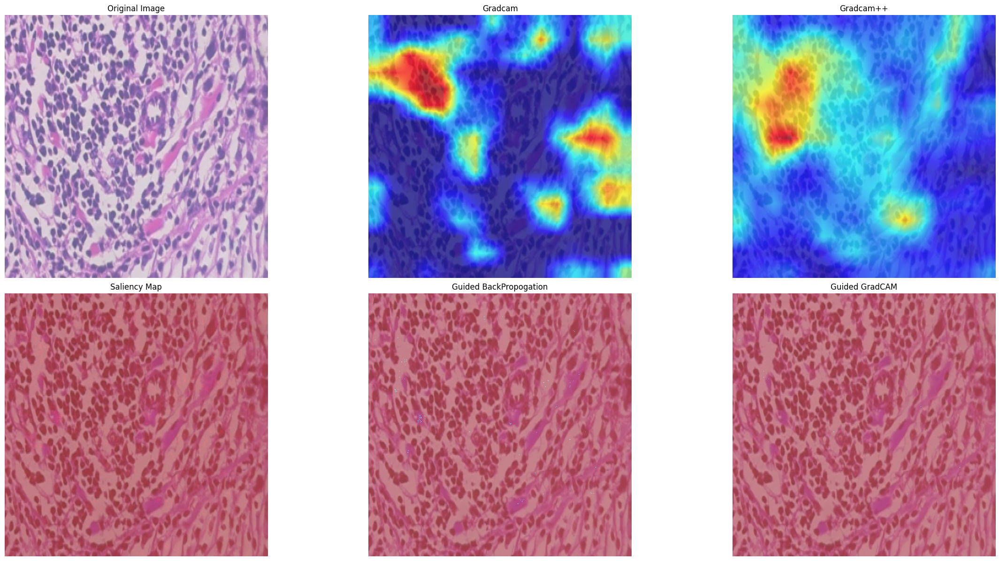

In [149]:
fig, axs = plt.subplots(2,3, figsize=(30,15))


img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

superimposed_img = cv2.addWeighted(img, 0.3, gradcam_activation_map, 0.7, 0)
superimposed_img1 = cv2.addWeighted(img, 0.3, gradcampp_activation_map,0.7,0)
superimposed_img2 = cv2.addWeighted(img, 0.6, saliency_am,0.5,0)
superimposed_img3 = cv2.addWeighted(img, 0.6, guided_backprop_am,0.5,0)
superimposed_img4 = cv2.addWeighted(img, 0.6, guided_gradcam_am,0.5,0)


axs[0, 0].imshow(img_rgb)
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

axs[0,1].imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
axs[0,1].set_title('Gradcam')
axs[0,1].axis('off')

axs[0,2].imshow(cv2.cvtColor(superimposed_img1, cv2.COLOR_BGR2RGB))
axs[0,2].set_title('Gradcam++')
axs[0,2].axis('off')


axs[1,0].imshow(superimposed_img2, cmap=plt.cm.hot)
axs[1,0].set_title('Saliency Map')
axs[1,0].axis('off')


axs[1,1].imshow(superimposed_img3)
axs[1,1].set_title("Guided BackPropogation")
axs[1,1].axis("off")

axs[1,2].imshow(superimposed_img4)
axs[1,2].set_title('Guided GradCAM')
axs[1,2].axis('off')

plt.subplots_adjust(wspace=0.001, hspace = 0.06)
plt.show()

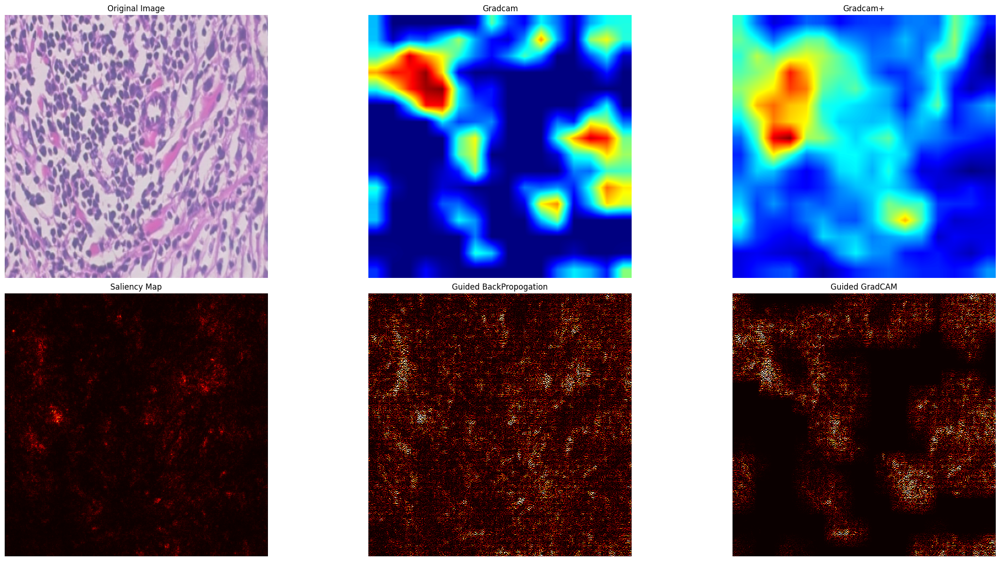

In [150]:
fig, axs = plt.subplots(2,3, figsize=(30,15))

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


axs[0, 0].imshow(img_rgb)
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

axs[0,1].imshow(cv2.cvtColor(gradcam_activation_map, cv2.COLOR_BGR2RGB))
axs[0,1].set_title('Gradcam')
axs[0,1].axis('off')

axs[0,2].imshow(cv2.cvtColor(gradcampp_activation_map, cv2.COLOR_BGR2RGB))
axs[0,2].set_title('Gradcam+')
axs[0,2].axis('off')


axs[1,0].imshow(saliency_activation_map, cmap=plt.cm.hot)
axs[1,0].set_title('Saliency Map')
axs[1,0].axis('off')


axs[1,1].imshow(guided_backprop_activation_map, cmap='hot', vmin=0, vmax=np.percentile(guided_backprop_activation_map, 99))
axs[1,1].set_title("Guided BackPropogation")
axs[1,1].axis("off")

axs[1,2].imshow(guided_gradcam_activation_map, cmap='hot', vmin=0, vmax=np.percentile(guided_gradcam_activation_map, 99))
axs[1,2].set_title('Guided GradCAM')
axs[1,2].axis('off')

plt.subplots_adjust(wspace=0.001, hspace = 0.06)
plt.show()

In [ ]:
img_path

'/content/SOB_B_A-14-29960CD-200-012.png'